In [233]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.interpolate import interp1d
from scipy.integrate import trapz

In [234]:
# data acquiring - read the time of each heartbeat and convert it from seconds to miliseconds. 1e-6 is
# added because float operations are not precise and upon convertion to int, x.9999999335 will be converted to x, not x + 1

files = {'chi': {}, 'yoga': {}, 'normal': {}, 'ironman': {}, 'metron': {}}
for folder in ('normal', 'ironman', 'metron'):
    with open(f'data/{folder}/RECORDS') as records_file:
        for filename in records_file.readlines():
            filename = filename.strip()
            with open(f'data/{folder}/{filename}') as file:
                files[folder][filename] = []
                time_prev = None
                for line in file.readlines():
                    time = float(line.split()[0])
                    time = int(time * 1000 + 1e-6)
                    if not time_prev:
                        time_prev = time
                        continue
                    files[folder][filename].append(time - time_prev)
                    time_prev = time
    
for folder in ('chi', 'yoga'):
    with open(f'data/{folder}/RECORDS') as records_file:
        for filename in records_file.readlines():
            filename = filename.strip()
            filename = filename[:2] + '.' + filename[2:]
            with open(f'data/{folder}/{filename}') as file:
                files[folder][filename] = []
                time_prev = None
                for line in file.readlines():
                    time = float(line.split()[0])
                    time = int(time * 1000 + 1e-6)
                    if not time_prev:
                        time_prev = time
                        continue
                    files[folder][filename].append(time - time_prev)
                    time_prev = time

The data in the dataset represents the time moments of heart beats - which are R peaks. So it can be safely used for calculating RR-intervals.

In [235]:
def remove_outliers(rr_intervals):
    return [val for val in rr_intervals if val < 3000]

def interval_plot(rr_intervals, title):
    plt.figure(figsize=(40, 15))
    plt.title(title)
    plt.xlabel("Time (sec)")
    plt.ylabel("RR-interval (ms)")

    plt.plot(np.cumsum(rr) / 1000, rr, label="RR-interval", color="#A651D8")
    plt.show()

    
# removing outliers because they make visualisation hard to use and they negatively affect the calculation of HRV
for key in files:
    for key2 in files[key]:
        files[key][key2] = remove_outliers(files[key][key2])

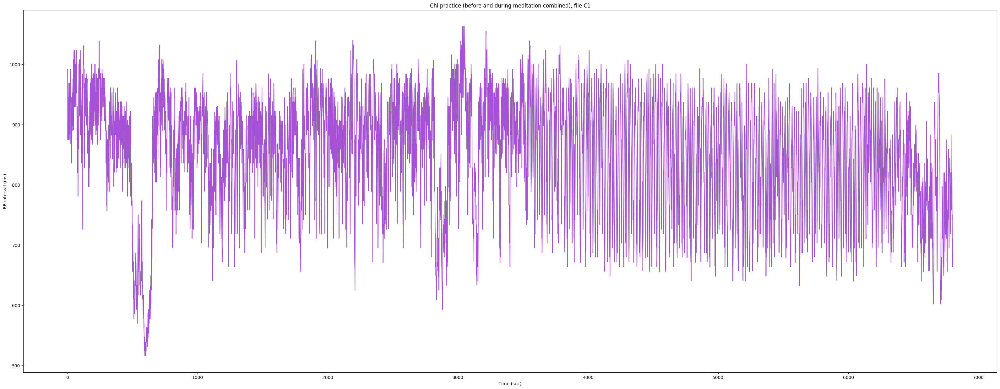

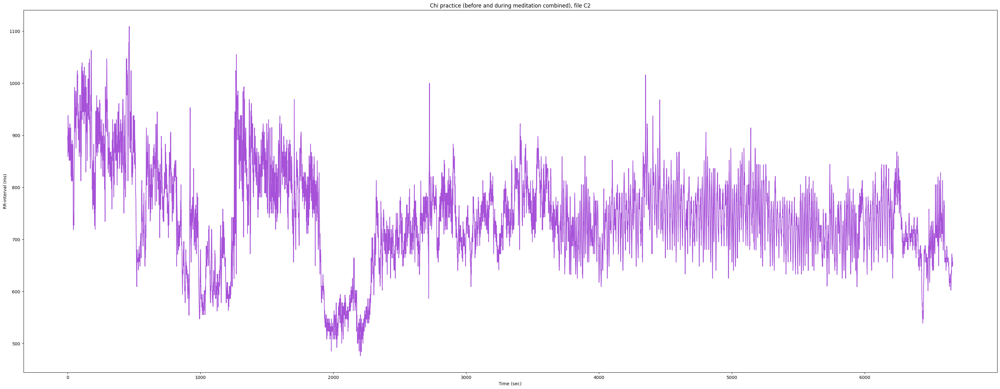

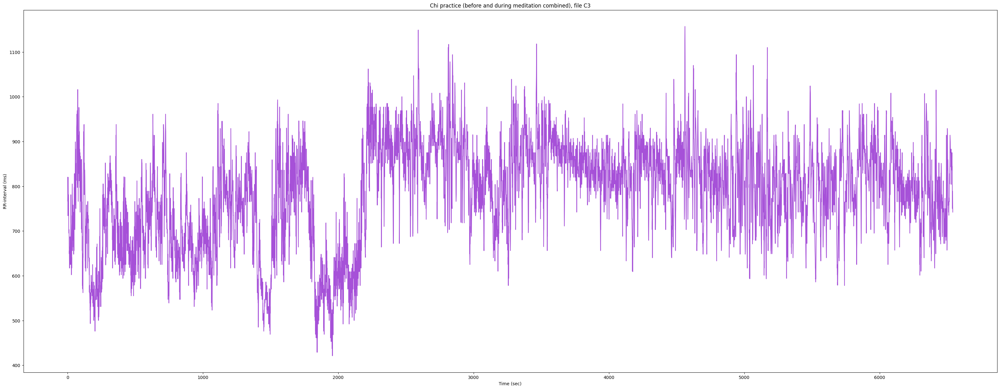

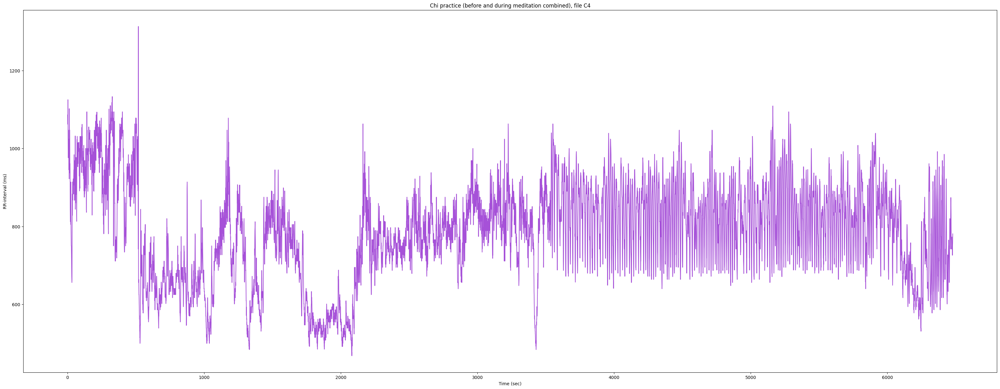

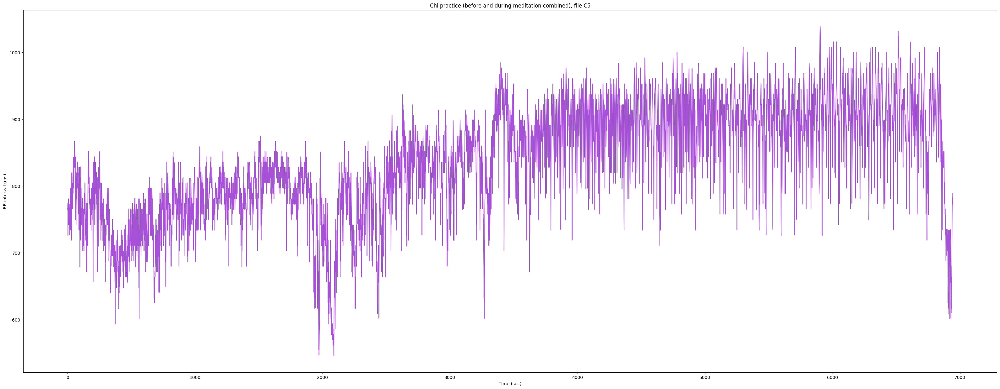

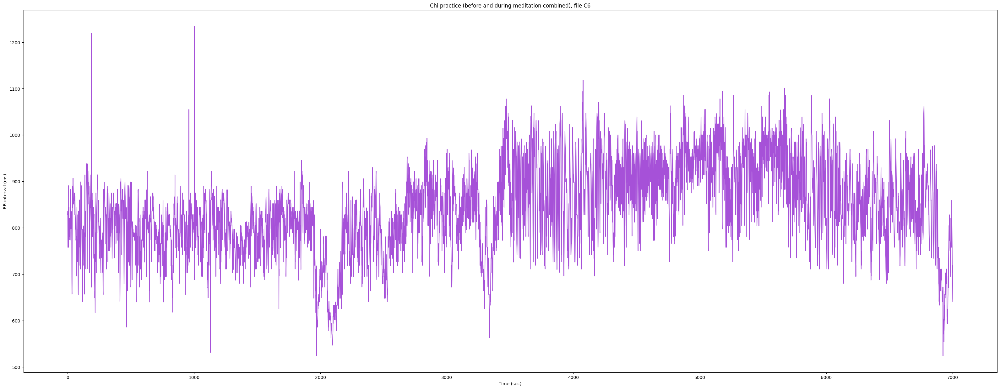

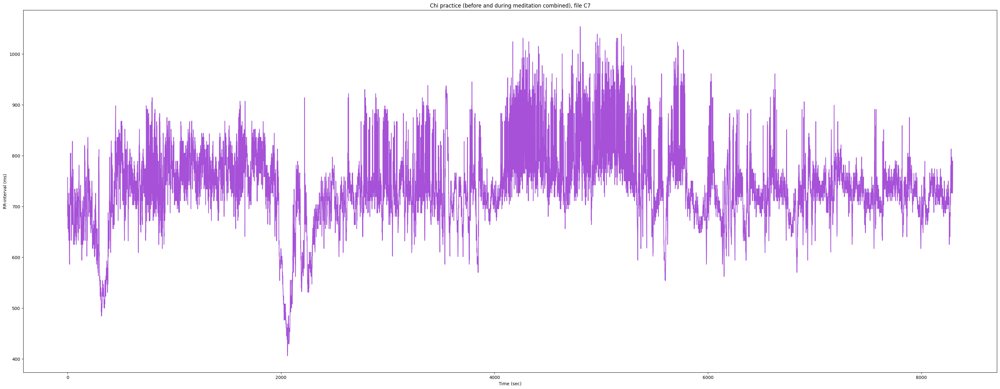

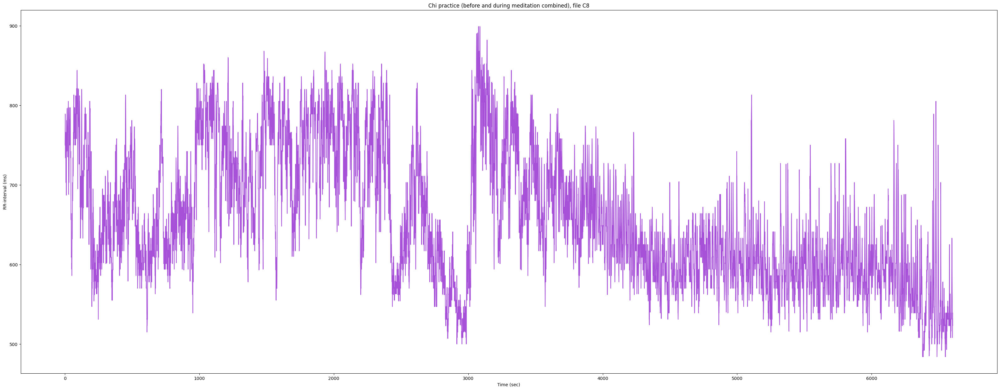

In [236]:
for key in files['chi']:
    if key.endswith('.pre'):
        key2 = key[:-3] + 'med'
        rr = files['chi'][key] + files['chi'][key2]
        interval_plot(rr, f"Chi practice (before and during meditation combined), file {key[:-4]}")
    

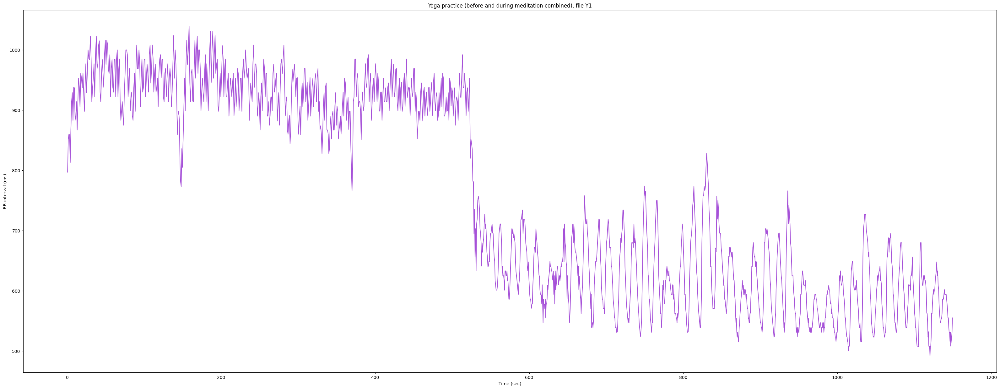

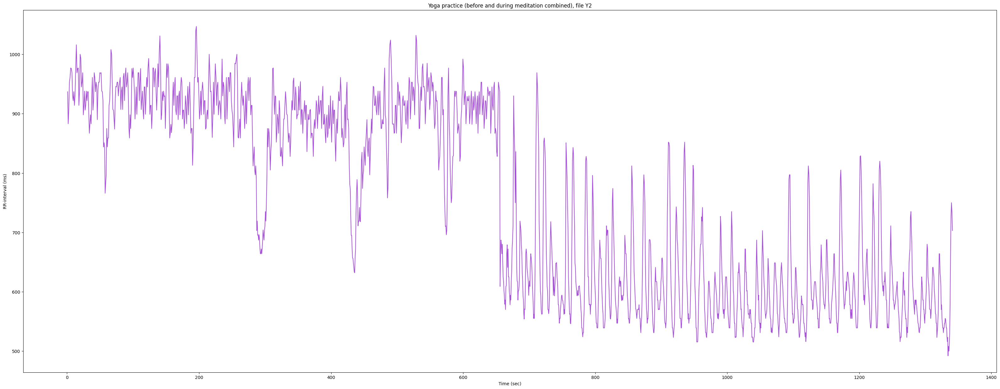

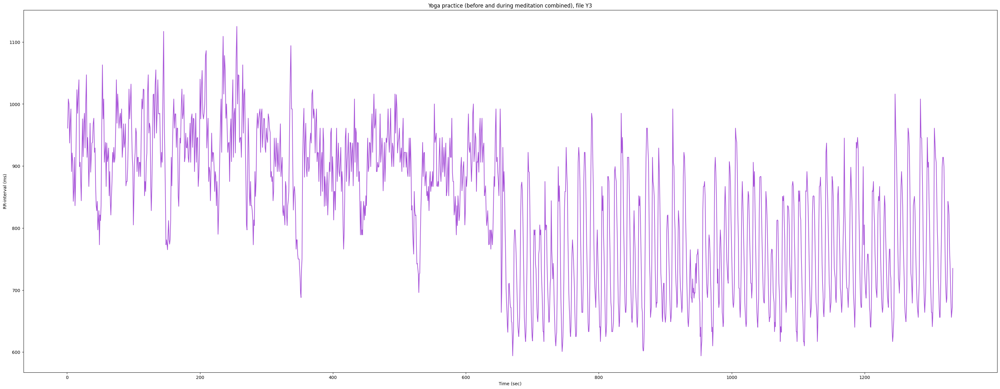

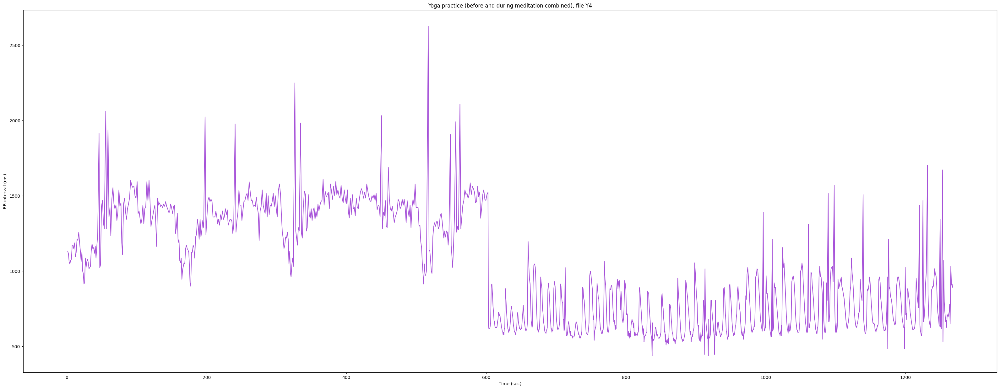

In [237]:
for key in files['yoga']:
    if key.endswith('.pre'):
        key2 = key[:-3] + 'med'
        rr = files['yoga'][key] + files['yoga'][key2]
        interval_plot(rr, f"Yoga practice (before and during meditation combined), file {key[:-4]}")
    

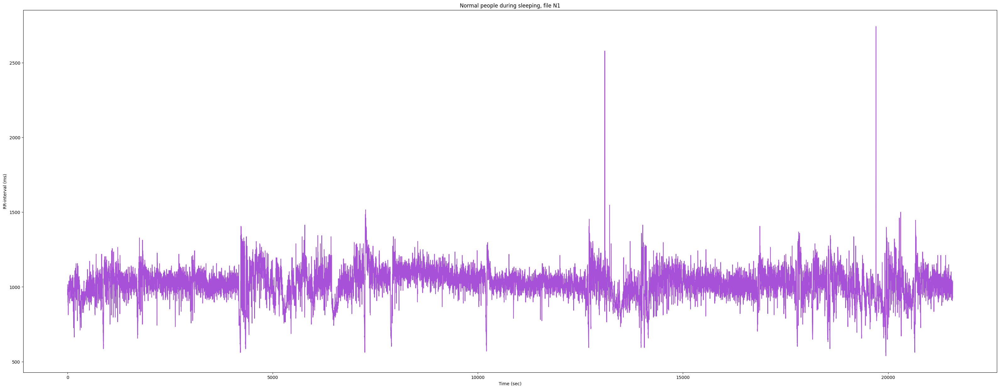

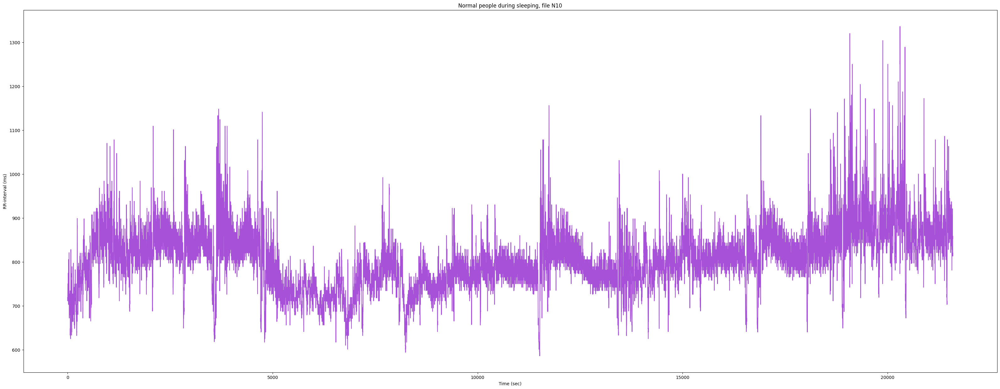

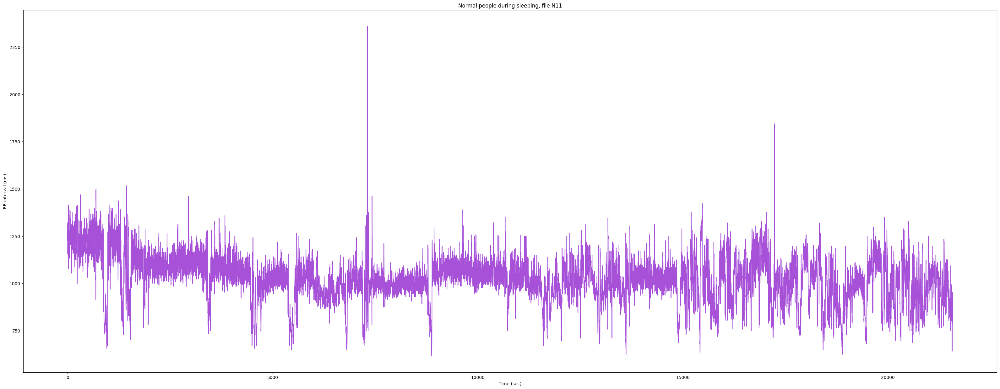

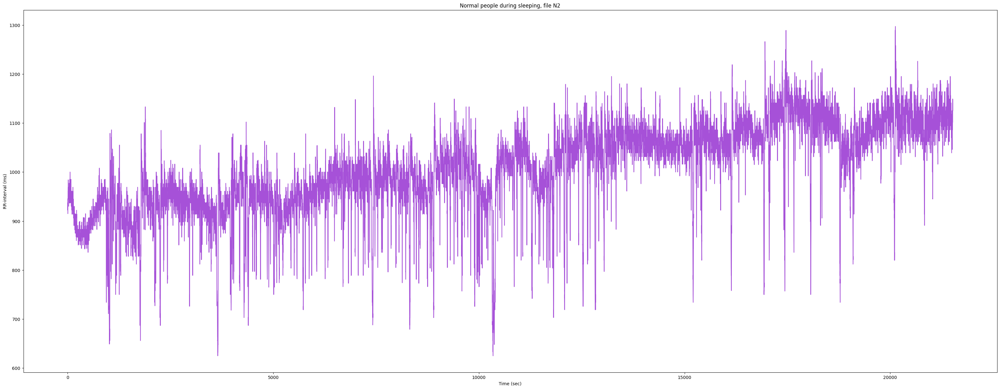

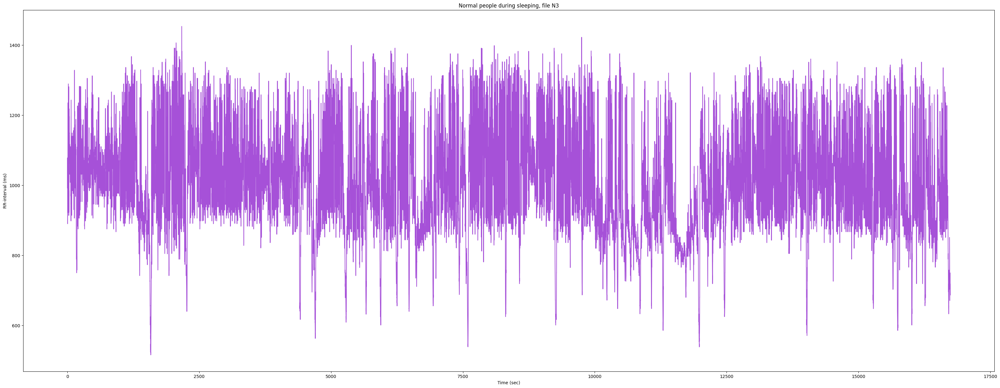

...

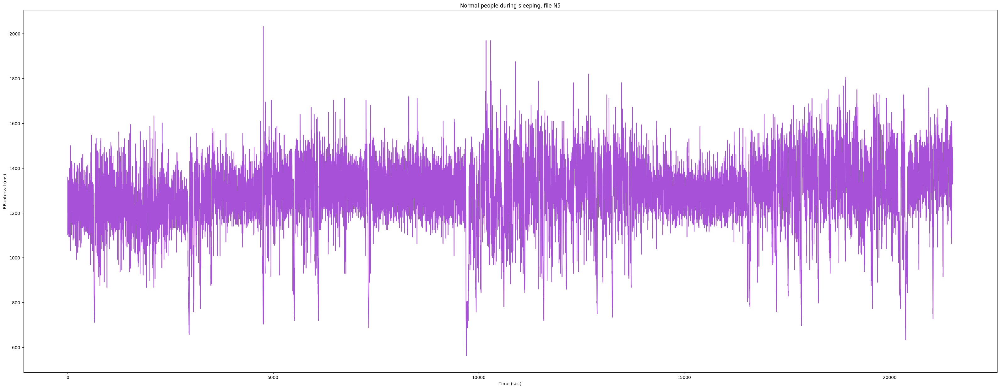

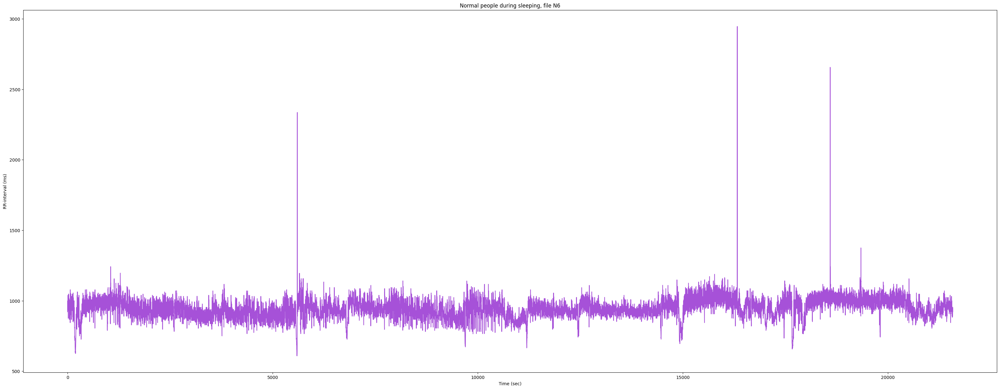

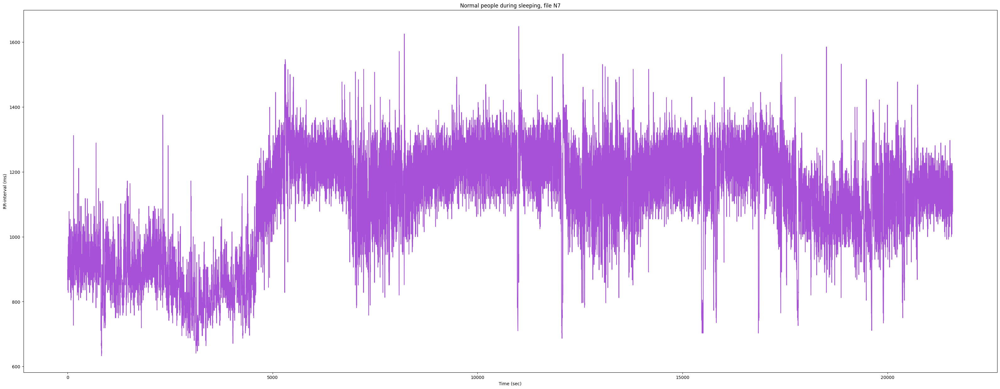

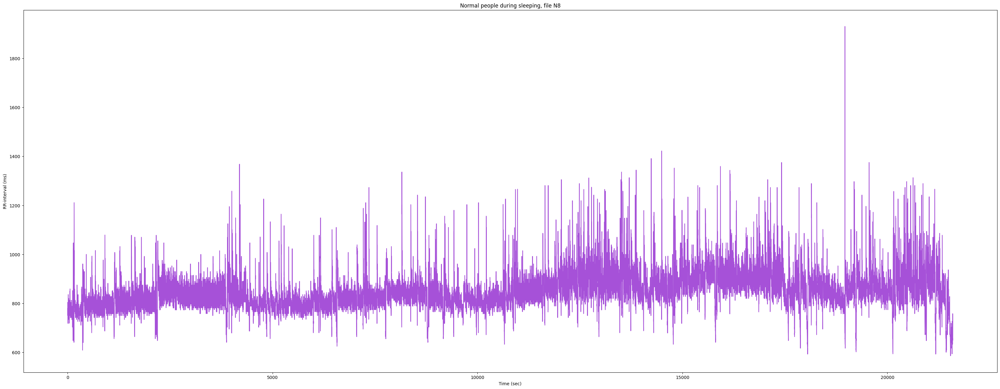

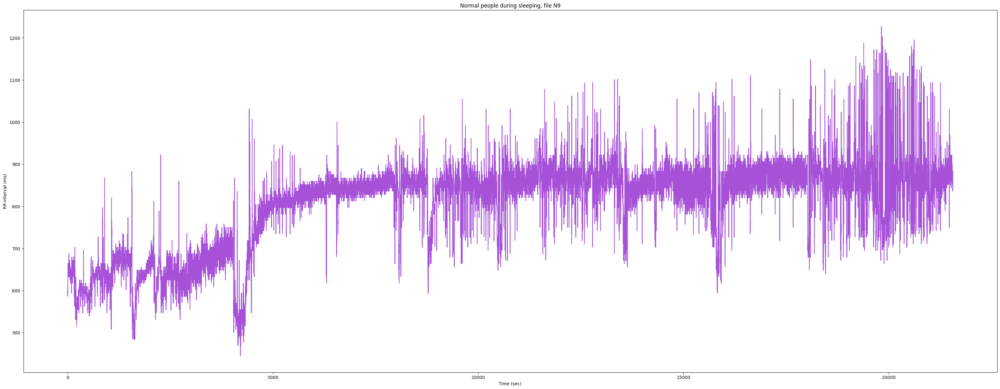

In [238]:
for key in files['normal']:
    rr = files['normal'][key]
    interval_plot(rr, f"Normal people during sleeping, file {key}")
    

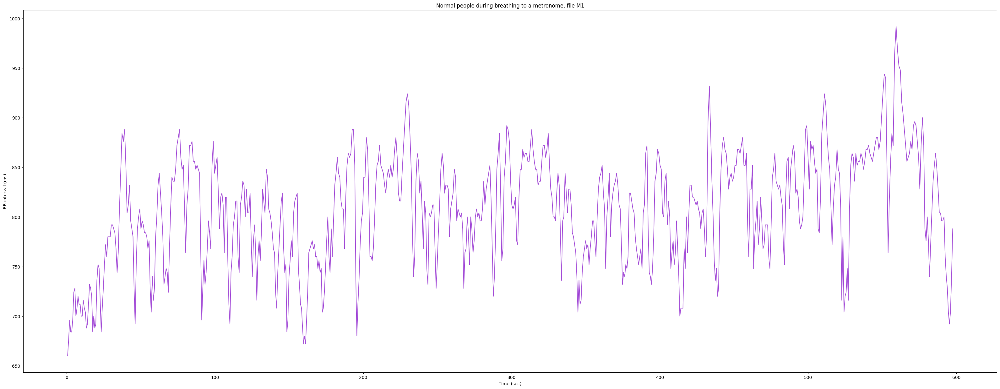

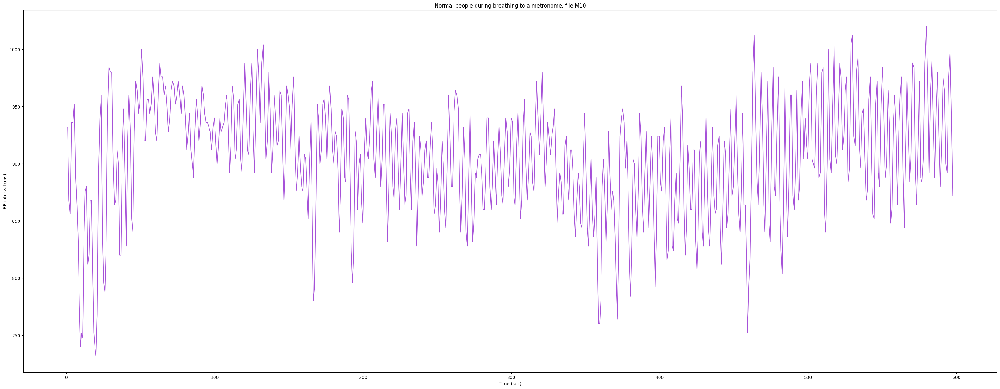

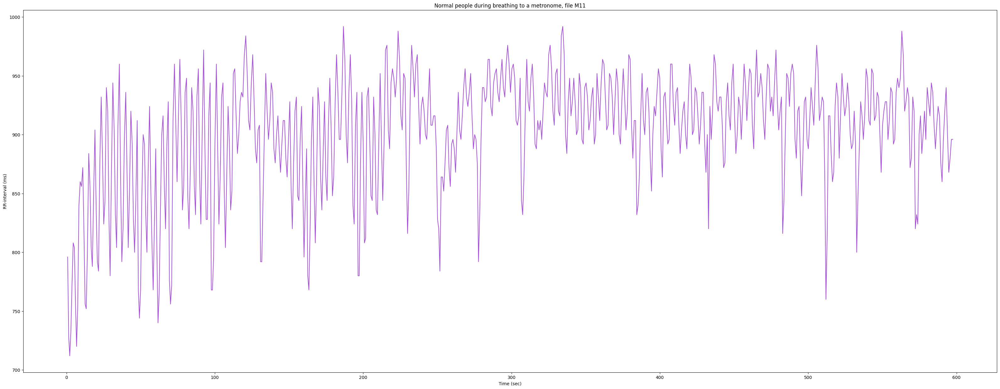

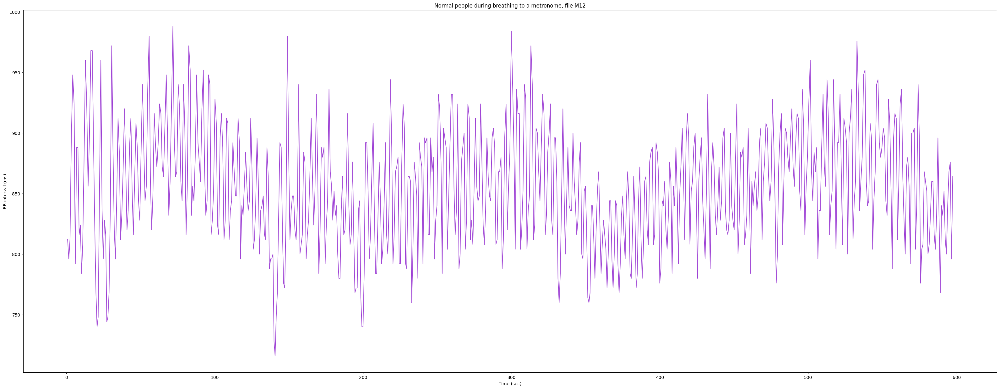

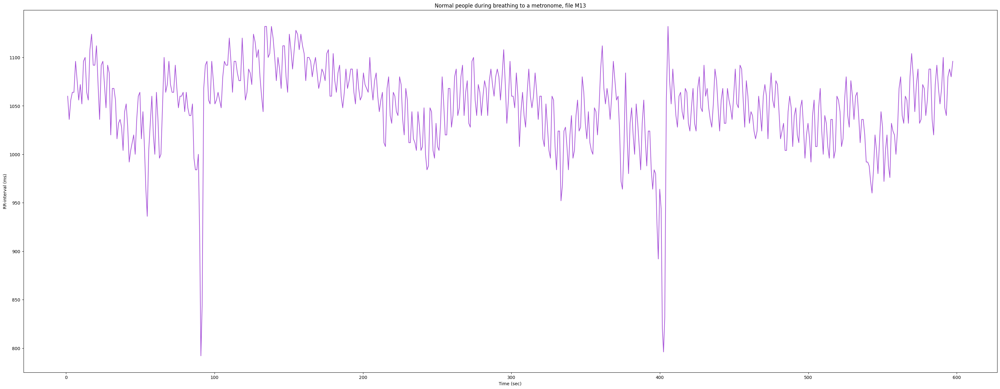

...

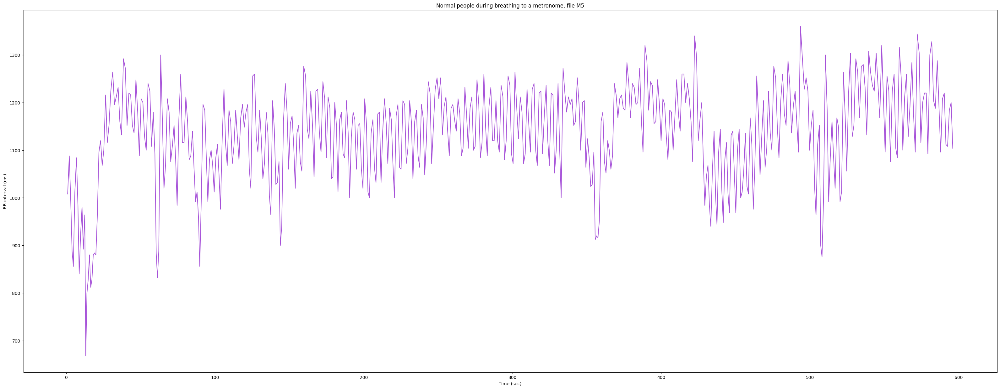

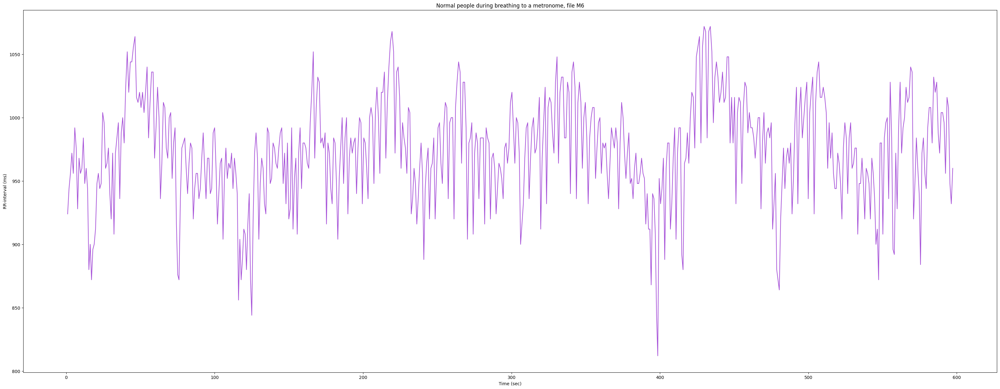

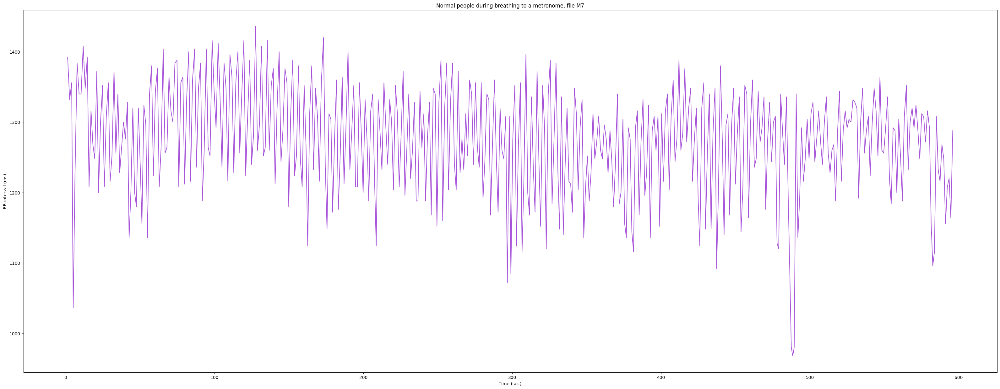

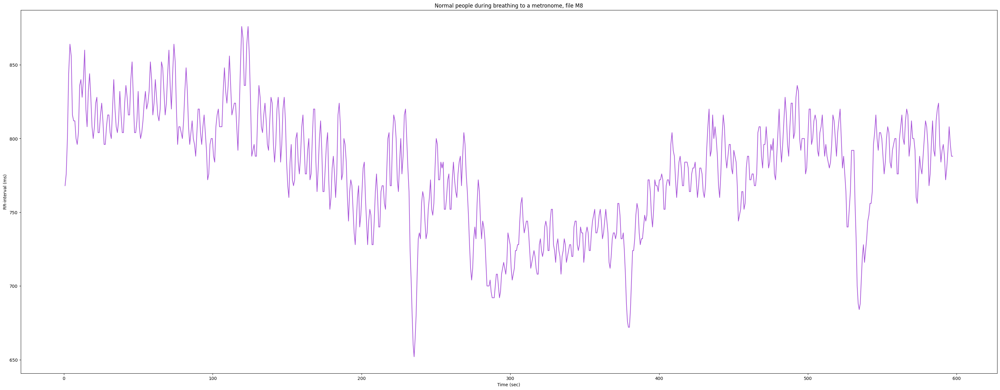

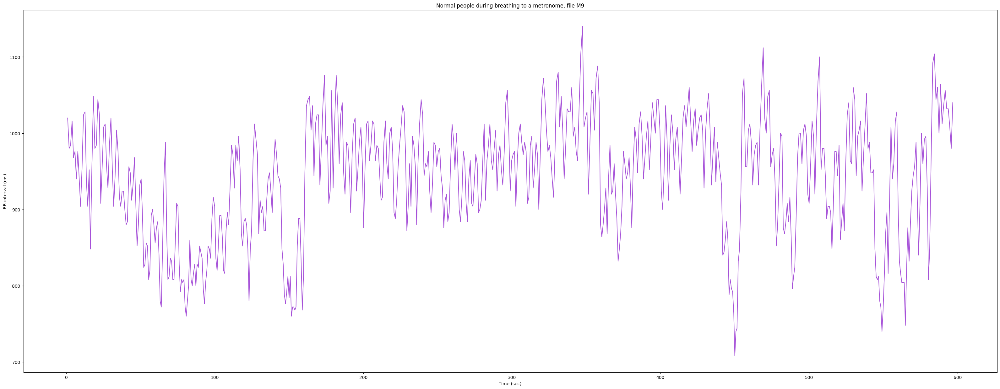

In [239]:
for key in files['metron']:
    rr = files['metron'][key])
    interval_plot(rr, f"Normal people during breathing to a metronome, file {key}")
    

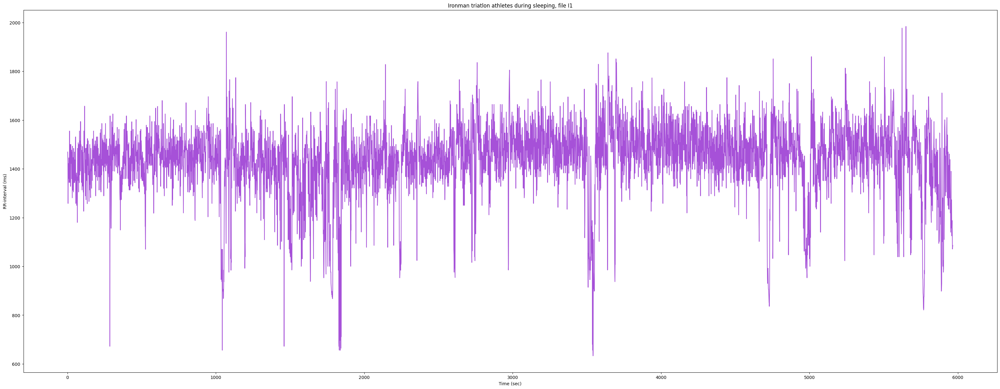

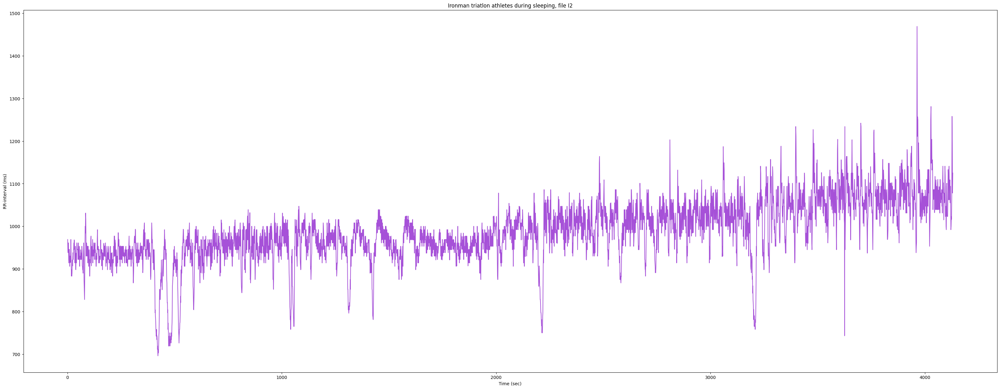

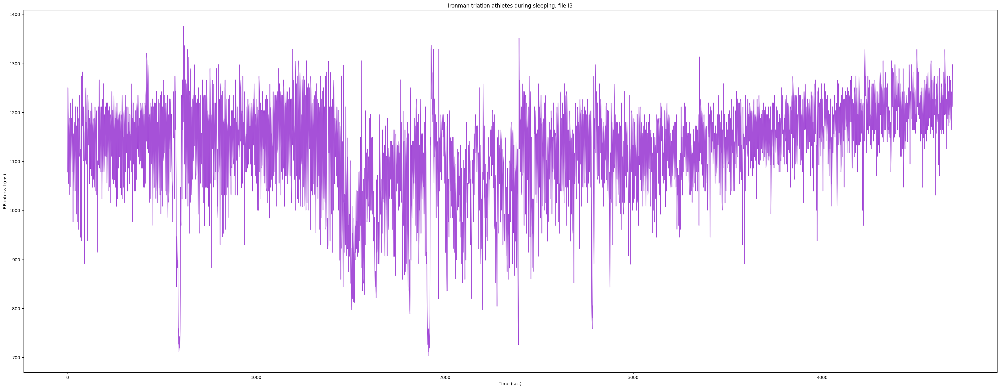

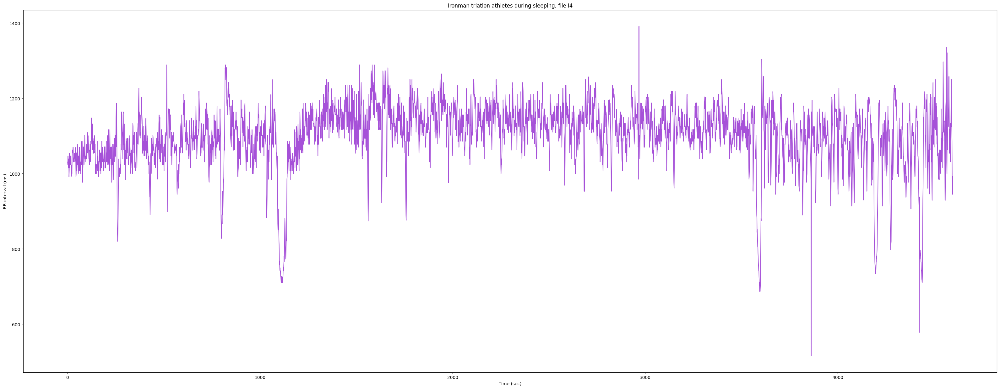

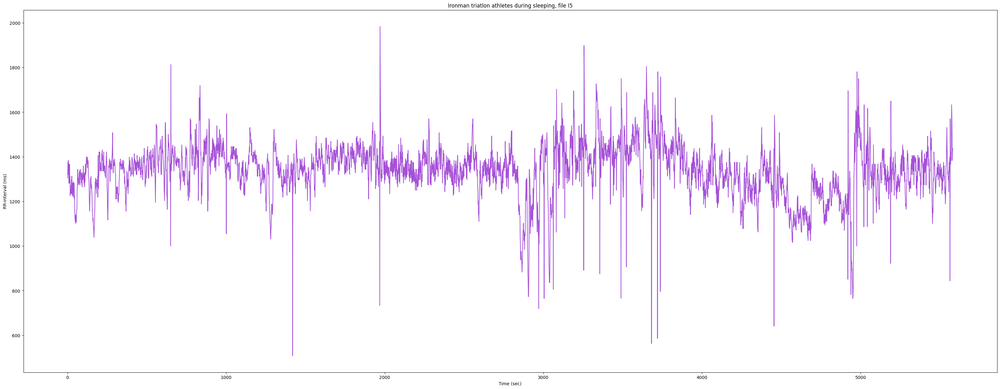

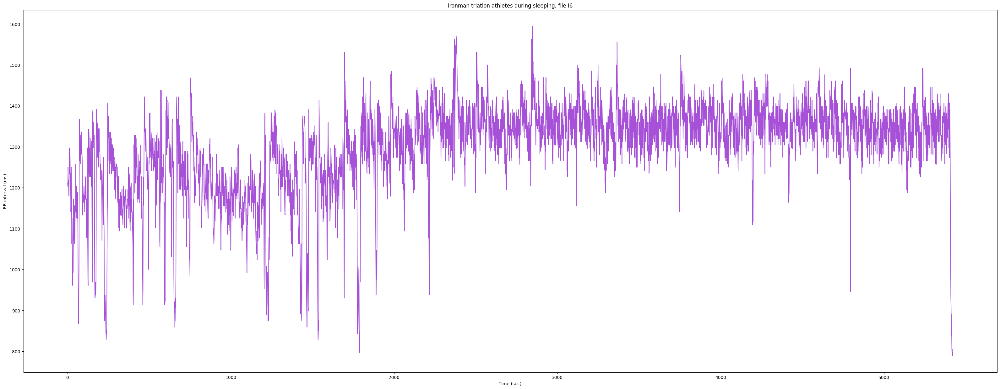

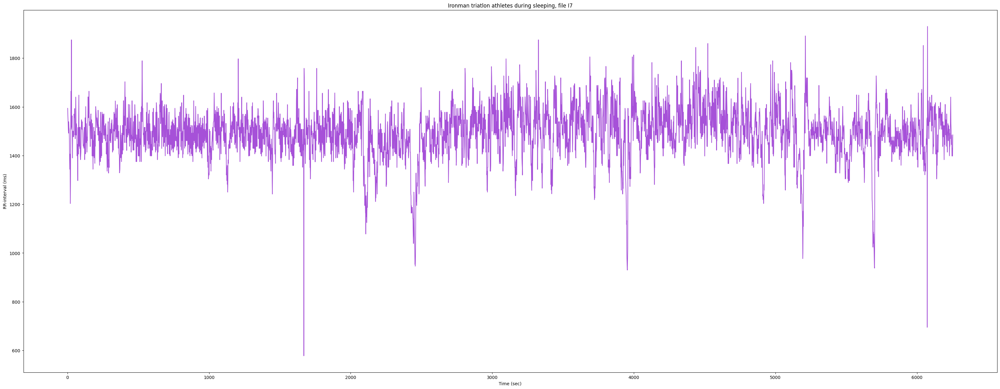

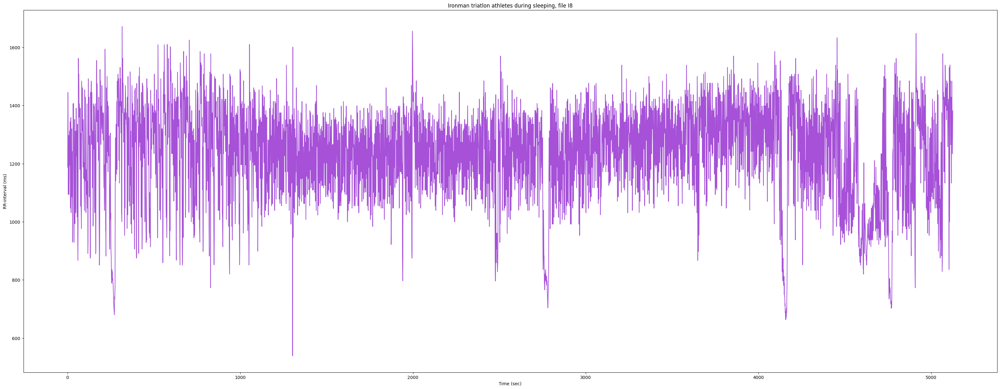

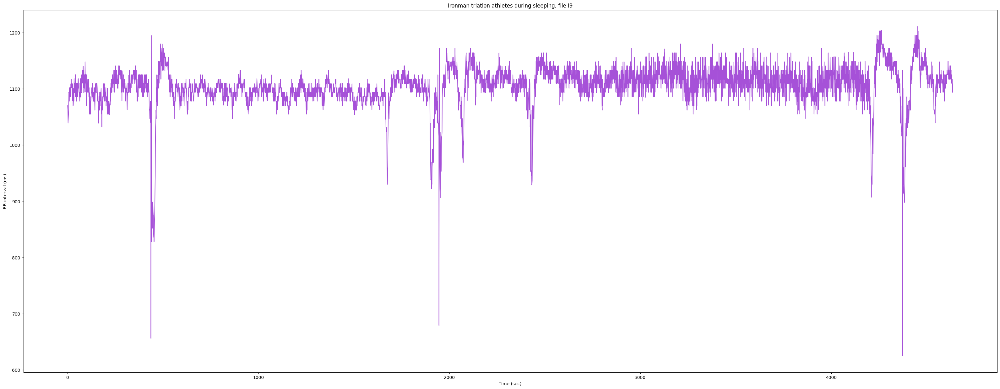

In [240]:
for key in files['ironman']:
    rr = files['ironman'][key]
    interval_plot(rr, f"Ironman triatlon athletes during sleeping, file {key}")
    

In [241]:
def timedomain(rr):
    results = {}

    hr = 60000/rr
    
    results['Mean RR (ms)'] = np.mean(rr)
    results['STD RR/SDNN (ms)'] = np.std(rr)
    results['Mean HR (Kubios\' style) (beats/min)'] = 60000/np.mean(rr)
    results['Mean HR (beats/min)'] = np.mean(hr)
    results['STD HR (beats/min)'] = np.std(hr)
    results['Min HR (beats/min)'] = np.min(hr)
    results['Max HR (beats/min)'] = np.max(hr)
    results['RMSSD (ms)'] = np.sqrt(np.mean(np.square(np.diff(rr))))
    results['NN50'] = np.sum(np.abs(np.diff(rr)) > 50)*1
    results['pNN50 (%)'] = 100 * np.sum((np.abs(np.diff(rr)) > 50)*1) / len(rr)
    return results

Now I won't remove outliers, because they should also be analyzed and don't interfere into plot

In [242]:
for key in files['chi']:
    rr = np.array(files['chi'][key])
    print("File:", key)
    print()
    for k, v in timedomain(rr).items():    
        print("- %s: %.2f" % (k, v))
    print()

File: C1.med

- Mean RR (ms): 824.64
- STD RR/SDNN (ms): 94.74
- Mean HR (Kubios' style) (beats/min): 72.76
- Mean HR (beats/min): 73.75
- STD HR (beats/min): 8.70
- Min HR (beats/min): 57.75
- Max HR (beats/min): 99.67
- RMSSD (ms): 36.54
- NN50: 627.00
- pNN50 (%): 15.55

File: C1.pre

- Mean RR (ms): 858.97
- STD RR/SDNN (ms): 101.87
- Mean HR (Kubios' style) (beats/min): 69.85
- Mean HR (beats/min): 71.03
- STD HR (beats/min): 10.09
- Min HR (beats/min): 56.44
- Max HR (beats/min): 116.28
- RMSSD (ms): 44.97
- NN50: 1036.00
- pNN50 (%): 25.60

File: C2.med

- Mean RR (ms): 732.47
- STD RR/SDNN (ms): 55.79
- Mean HR (Kubios' style) (beats/min): 81.91
- Mean HR (beats/min): 82.39
- STD HR (beats/min): 6.32
- Min HR (beats/min): 59.06
- Max HR (beats/min): 111.32
- RMSSD (ms): 20.64
- NN50: 83.00
- pNN50 (%): 1.92

File: C2.pre

- Mean RR (ms): 733.46
- STD RR/SDNN (ms): 116.53
- Mean HR (Kubios' style) (beats/min): 81.80
- Mean HR (beats/min): 83.99
- STD HR (beats/min): 14.00
- Min 

In [243]:
for key in files['yoga']:
    rr = np.array(files['yoga'][key])
    print("File:", key)
    print()
    for k, v in timedomain(rr).items():    
        print("- %s: %.2f" % (k, v))
    print()

File: Y1.med

- Mean RR (ms): 613.74
- STD RR/SDNN (ms): 63.44
- Mean HR (Kubios' style) (beats/min): 97.76
- Mean HR (beats/min): 98.77
- STD HR (beats/min): 9.83
- Min HR (beats/min): 70.42
- Max HR (beats/min): 121.95
- RMSSD (ms): 19.99
- NN50: 23.00
- pNN50 (%): 2.25

File: Y1.pre

- Mean RR (ms): 931.62
- STD RR/SDNN (ms): 43.03
- Mean HR (Kubios' style) (beats/min): 64.40
- Mean HR (beats/min): 64.54
- STD HR (beats/min): 3.06
- Min HR (beats/min): 57.75
- Max HR (beats/min): 78.33
- RMSSD (ms): 38.33
- NN50: 107.00
- pNN50 (%): 19.07

File: Y2.med

- Mean RR (ms): 608.97
- STD RR/SDNN (ms): 72.02
- Mean HR (Kubios' style) (beats/min): 98.53
- Mean HR (beats/min): 99.73
- STD HR (beats/min): 10.32
- Min HR (beats/min): 61.92
- Max HR (beats/min): 121.95
- RMSSD (ms): 31.20
- NN50: 98.00
- pNN50 (%): 8.70

File: Y2.pre

- Mean RR (ms): 895.27
- STD RR/SDNN (ms): 71.09
- Mean HR (Kubios' style) (beats/min): 67.02
- Mean HR (beats/min): 67.51
- STD HR (beats/min): 6.21
- Min HR (be

In [244]:
for key in files['normal']:
    rr = np.array(files['normal'][key])
    print("File:", key)
    print()
    for k, v in timedomain(rr).items():    
        print("- %s: %.2f" % (k, v))
    print()

File: N1

- Mean RR (ms): 1012.13
- STD RR/SDNN (ms): 107.92
- Mean HR (Kubios' style) (beats/min): 59.28
- Mean HR (beats/min): 60.04
- STD HR (beats/min): 7.34
- Min HR (beats/min): 21.88
- Max HR (beats/min): 111.32
- RMSSD (ms): 65.85
- NN50: 7439.00
- pNN50 (%): 34.90

File: N10

- Mean RR (ms): 801.96
- STD RR/SDNN (ms): 70.08
- Mean HR (Kubios' style) (beats/min): 74.82
- Mean HR (beats/min): 75.38
- STD HR (beats/min): 6.53
- Min HR (beats/min): 44.91
- Max HR (beats/min): 102.39
- RMSSD (ms): 26.19
- NN50: 1145.00
- pNN50 (%): 4.25

File: N11

- Mean RR (ms): 1013.90
- STD RR/SDNN (ms): 128.23
- Mean HR (Kubios' style) (beats/min): 59.18
- Mean HR (beats/min): 60.21
- STD HR (beats/min): 8.31
- Min HR (beats/min): 25.43
- Max HR (beats/min): 97.24
- RMSSD (ms): 50.10
- NN50: 5475.00
- pNN50 (%): 25.72

File: N2

- Mean RR (ms): 995.22
- STD RR/SDNN (ms): 95.66
- Mean HR (Kubios' style) (beats/min): 60.29
- Mean HR (beats/min): 60.90
- STD HR (beats/min): 6.43
- Min HR (beats/m

In [245]:
for key in files['metron']:
    rr = np.array(files['metron'][key])
    print("File:", key)
    print()
    for k, v in timedomain(rr).items():    
        print("- %s: %.2f" % (k, v))
    print()

File: M1

- Mean RR (ms): 804.15
- STD RR/SDNN (ms): 55.53
- Mean HR (Kubios' style) (beats/min): 74.61
- Mean HR (beats/min): 74.98
- STD HR (beats/min): 5.28
- Min HR (beats/min): 60.48
- Max HR (beats/min): 90.91
- RMSSD (ms): 28.98
- NN50: 59.00
- pNN50 (%): 7.94

File: M10

- Mean RR (ms): 903.94
- STD RR/SDNN (ms): 50.90
- Mean HR (Kubios' style) (beats/min): 66.38
- Mean HR (beats/min): 66.59
- STD HR (beats/min): 3.90
- Min HR (beats/min): 58.82
- Max HR (beats/min): 81.97
- RMSSD (ms): 45.49
- NN50: 192.00
- pNN50 (%): 29.05

File: M11

- Mean RR (ms): 899.76
- STD RR/SDNN (ms): 51.30
- Mean HR (Kubios' style) (beats/min): 66.68
- Mean HR (beats/min): 66.92
- STD HR (beats/min): 4.10
- Min HR (beats/min): 60.48
- Max HR (beats/min): 84.27
- RMSSD (ms): 43.21
- NN50: 147.00
- pNN50 (%): 22.14

File: M12

- Mean RR (ms): 854.67
- STD RR/SDNN (ms): 48.61
- Mean HR (Kubios' style) (beats/min): 70.20
- Mean HR (beats/min): 70.43
- STD HR (beats/min): 4.01
- Min HR (beats/min): 60.7

In [246]:
for key in files['ironman']:
    rr = np.array(files['ironman'][key])
    print("File:", key)
    print()
    for k, v in timedomain(rr).items():    
        print("- %s: %.2f" % (k, v))
    print()

File: I1

- Mean RR (ms): 1420.84
- STD RR/SDNN (ms): 167.02
- Mean HR (Kubios' style) (beats/min): 42.23
- Mean HR (beats/min): 42.98
- STD HR (beats/min): 6.59
- Min HR (beats/min): 30.24
- Max HR (beats/min): 94.79
- RMSSD (ms): 160.55
- NN50: 3171.00
- pNN50 (%): 75.52

File: I2

- Mean RR (ms): 983.67
- STD RR/SDNN (ms): 74.52
- Mean HR (Kubios' style) (beats/min): 61.00
- Mean HR (beats/min): 61.36
- STD HR (beats/min): 4.93
- Min HR (beats/min): 40.84
- Max HR (beats/min): 86.21
- RMSSD (ms): 37.27
- NN50: 571.00
- pNN50 (%): 13.60

File: I3

- Mean RR (ms): 1117.88
- STD RR/SDNN (ms): 103.97
- Mean HR (Kubios' style) (beats/min): 53.67
- Mean HR (beats/min): 54.20
- STD HR (beats/min): 5.78
- Min HR (beats/min): 43.64
- Max HR (beats/min): 85.35
- RMSSD (ms): 82.44
- NN50: 2150.00
- pNN50 (%): 51.21

File: I4

- Mean RR (ms): 1094.76
- STD RR/SDNN (ms): 90.93
- Mean HR (Kubios' style) (beats/min): 54.81
- Mean HR (beats/min): 55.27
- STD HR (beats/min): 5.67
- Min HR (beats/min

In [247]:
def frequency_domain(rri, fs=4):
    fxx, pxx = signal.welch(x=rri, fs=fs)
    cond_vlf = (fxx >= 0) & (fxx < 0.04)
    cond_lf = (fxx >= 0.04) & (fxx < 0.15)
    cond_hf = (fxx >= 0.15) & (fxx < 0.4)
    
    vlf = trapz(pxx[cond_vlf], fxx[cond_vlf])
    lf = trapz(pxx[cond_lf], fxx[cond_lf])
    hf = trapz(pxx[cond_hf], fxx[cond_hf])
    
    total_power = vlf + lf + hf

    peak_vlf = fxx[cond_vlf][np.argmax(pxx[cond_vlf])]
    peak_lf = fxx[cond_lf][np.argmax(pxx[cond_lf])]
    peak_hf = fxx[cond_hf][np.argmax(pxx[cond_hf])]

    lf_nu = 100 * lf / (lf + hf)
    hf_nu = 100 * hf / (lf + hf)
    
    results = {}
    results['Power VLF (ms2)'] = vlf
    results['Power LF (ms2)'] = lf
    results['Power HF (ms2)'] = hf   
    results['Power Total (ms2)'] = total_power

    results['LF/HF'] = (lf/hf)
    results['Peak VLF (Hz)'] = peak_vlf
    results['Peak LF (Hz)'] = peak_lf
    results['Peak HF (Hz)'] = peak_hf

    results['Fraction LF (nu)'] = lf_nu
    results['Fraction HF (nu)'] = hf_nu
    return results, fxx, pxx

In [248]:
for key in files['chi']:
    # preparing to calculate values of frequency domain
    # have to interpolate the data because it is not evenly spaced for FFT yet
    
    rr = np.array(files['chi'][key])
    
    x = np.cumsum(rr) / 1000.0
    f = interp1d(x, rr, kind='cubic', fill_value='extrapolate')

    fs = 4.0
    steps = 1 / fs

    xx = np.arange(1, np.max(x), steps)
    rr_interpolated = f(xx)

    print(f"Frequency domain metrics for file {key}:")
    print()
    results, fxx, pxx = frequency_domain(rr_interpolated)

    for k, v in results.items():
        print("- %s: %.2f" % (k, v))
    print()

Frequency domain metrics for file C1.med:

- Power VLF (ms2): 1122.90
- Power LF (ms2): 4422.15
- Power HF (ms2): 328.76
- Power Total (ms2): 5873.81
- LF/HF: 13.45
- Peak VLF (Hz): 0.03
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.16
- Fraction LF (nu): 93.08
- Fraction HF (nu): 6.92

Frequency domain metrics for file C1.pre:

- Power VLF (ms2): 1320.22
- Power LF (ms2): 1311.55
- Power HF (ms2): 755.20
- Power Total (ms2): 3386.96
- LF/HF: 1.74
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.16
- Fraction LF (nu): 63.46
- Fraction HF (nu): 36.54

Frequency domain metrics for file C2.med:

- Power VLF (ms2): 345.68
- Power LF (ms2): 1336.70
- Power HF (ms2): 76.82
- Power Total (ms2): 1759.20
- LF/HF: 17.40
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.06
- Peak HF (Hz): 0.16
- Fraction LF (nu): 94.57
- Fraction HF (nu): 5.43

Frequency domain metrics for file C2.pre:

- Power VLF (ms2): 794.77
- Power LF (ms2): 656.92
- Power HF (ms2): 294.48
- Power Total (ms2): 1746.17
- LF/HF: 2.

In [249]:
for key in files['yoga']:
    # preparing to calculate values of frequency domain
    # have to interpolate the data because it is not evenly spaced for FFT yet
    
    rr = np.array(files['yoga'][key])
    
    x = np.cumsum(rr) / 1000.0
    f = interp1d(x, rr, kind='cubic', fill_value='extrapolate')

    fs = 4.0
    steps = 1 / fs

    xx = np.arange(1, np.max(x), steps)
    rr_interpolated = f(xx)

    print(f"Frequency domain metrics for file {key}:")
    print()
    results, fxx, pxx = frequency_domain(rr_interpolated)

    for k, v in results.items():
        print("- %s: %.2f" % (k, v))
    print()

Frequency domain metrics for file Y1.med:

- Power VLF (ms2): 343.87
- Power LF (ms2): 2427.57
- Power HF (ms2): 81.17
- Power Total (ms2): 2852.60
- LF/HF: 29.91
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.06
- Peak HF (Hz): 0.19
- Fraction LF (nu): 96.76
- Fraction HF (nu): 3.24

Frequency domain metrics for file Y1.pre:

- Power VLF (ms2): 201.43
- Power LF (ms2): 536.19
- Power HF (ms2): 473.24
- Power Total (ms2): 1210.85
- LF/HF: 1.13
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.08
- Peak HF (Hz): 0.30
- Fraction LF (nu): 53.12
- Fraction HF (nu): 46.88

Frequency domain metrics for file Y2.med:

- Power VLF (ms2): 586.52
- Power LF (ms2): 4318.75
- Power HF (ms2): 267.36
- Power Total (ms2): 5172.63
- LF/HF: 16.15
- Peak VLF (Hz): 0.03
- Peak LF (Hz): 0.09
- Peak HF (Hz): 0.16
- Fraction LF (nu): 94.17
- Fraction HF (nu): 5.83

Frequency domain metrics for file Y2.pre:

- Power VLF (ms2): 1251.22
- Power LF (ms2): 1104.44
- Power HF (ms2): 351.48
- Power Total (ms2): 2707.14
- LF/HF: 3.1

In [250]:
for key in files['normal']:
    # preparing to calculate values of frequency domain
    # have to interpolate the data because it is not evenly spaced for FFT yet
    
    rr = np.array(files['normal'][key])
    
    x = np.cumsum(rr) / 1000.0
    f = interp1d(x, rr, kind='cubic', fill_value='extrapolate')

    fs = 4.0
    steps = 1 / fs

    xx = np.arange(1, np.max(x), steps)
    rr_interpolated = f(xx)

    print(f"Frequency domain metrics for file {key}:")
    print()
    results, fxx, pxx = frequency_domain(rr_interpolated)

    for k, v in results.items():
        print("- %s: %.2f" % (k, v))
    print()

Frequency domain metrics for file N1:

- Power VLF (ms2): 2575.63
- Power LF (ms2): 2184.78
- Power HF (ms2): 1237.29
- Power Total (ms2): 5997.70
- LF/HF: 1.77
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.31
- Fraction LF (nu): 63.84
- Fraction HF (nu): 36.16

Frequency domain metrics for file N10:

- Power VLF (ms2): 540.17
- Power LF (ms2): 744.38
- Power HF (ms2): 348.75
- Power Total (ms2): 1633.30
- LF/HF: 2.13
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.06
- Peak HF (Hz): 0.19
- Fraction LF (nu): 68.10
- Fraction HF (nu): 31.90

Frequency domain metrics for file N11:

- Power VLF (ms2): 2751.18
- Power LF (ms2): 1836.80
- Power HF (ms2): 694.22
- Power Total (ms2): 5282.20
- LF/HF: 2.65
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.23
- Fraction LF (nu): 72.57
- Fraction HF (nu): 27.43

Frequency domain metrics for file N2:

- Power VLF (ms2): 1378.79
- Power LF (ms2): 604.99
- Power HF (ms2): 164.04
- Power Total (ms2): 2147.81
- LF/HF: 3.69
- Peak VL

In [251]:
for key in files['metron']:
    # preparing to calculate values of frequency domain
    # have to interpolate the data because it is not evenly spaced for FFT yet
    
    rr = np.array(files['metron'][key])
    
    x = np.cumsum(rr) / 1000.0
    f = interp1d(x, rr, kind='cubic', fill_value='extrapolate')

    fs = 4.0
    steps = 1 / fs

    xx = np.arange(1, np.max(x), steps)
    rr_interpolated = f(xx)

    print(f"Frequency domain metrics for file {key}:")
    print()
    results, fxx, pxx = frequency_domain(rr_interpolated)

    for k, v in results.items():
        print("- %s: %.2f" % (k, v))
    print()

Frequency domain metrics for file M1:

- Power VLF (ms2): 494.34
- Power LF (ms2): 936.26
- Power HF (ms2): 295.83
- Power Total (ms2): 1726.43
- LF/HF: 3.16
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.09
- Peak HF (Hz): 0.17
- Fraction LF (nu): 75.99
- Fraction HF (nu): 24.01

Frequency domain metrics for file M10:

- Power VLF (ms2): 170.56
- Power LF (ms2): 372.39
- Power HF (ms2): 1083.48
- Power Total (ms2): 1626.43
- LF/HF: 0.34
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.25
- Fraction LF (nu): 25.58
- Fraction HF (nu): 74.42

Frequency domain metrics for file M11:

- Power VLF (ms2): 256.00
- Power LF (ms2): 391.95
- Power HF (ms2): 1026.50
- Power Total (ms2): 1674.45
- LF/HF: 0.38
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.25
- Fraction LF (nu): 27.63
- Fraction HF (nu): 72.37

Frequency domain metrics for file M12:

- Power VLF (ms2): 131.36
- Power LF (ms2): 233.92
- Power HF (ms2): 1321.16
- Power Total (ms2): 1686.44
- LF/HF: 0.18
- Peak VLF 

In [252]:
for key in files['ironman']:
    # preparing to calculate values of frequency domain
    # have to interpolate the data because it is not evenly spaced for FFT yet
    
    rr = np.array(files['ironman'][key])
    
    x = np.cumsum(rr) / 1000.0
    f = interp1d(x, rr, kind='cubic', fill_value='extrapolate')

    fs = 4.0
    steps = 1 / fs

    xx = np.arange(1, np.max(x), steps)
    rr_interpolated = f(xx)

    print(f"Frequency domain metrics for file {key}:")
    print()
    results, fxx, pxx = frequency_domain(rr_interpolated)

    for k, v in results.items():
        print("- %s: %.2f" % (k, v))
    print()

Frequency domain metrics for file I1:

- Power VLF (ms2): 4844.04
- Power LF (ms2): 3952.99
- Power HF (ms2): 5323.94
- Power Total (ms2): 14120.97
- LF/HF: 0.74
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.25
- Fraction LF (nu): 42.61
- Fraction HF (nu): 57.39

Frequency domain metrics for file I2:

- Power VLF (ms2): 792.05
- Power LF (ms2): 610.53
- Power HF (ms2): 382.86
- Power Total (ms2): 1785.45
- LF/HF: 1.59
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.27
- Fraction LF (nu): 61.46
- Fraction HF (nu): 38.54

Frequency domain metrics for file I3:

- Power VLF (ms2): 1302.27
- Power LF (ms2): 1223.27
- Power HF (ms2): 3264.91
- Power Total (ms2): 5790.45
- LF/HF: 0.37
- Peak VLF (Hz): 0.02
- Peak LF (Hz): 0.05
- Peak HF (Hz): 0.19
- Fraction LF (nu): 27.26
- Fraction HF (nu): 72.74

Frequency domain metrics for file I4:

- Power VLF (ms2): 1720.48
- Power LF (ms2): 1304.43
- Power HF (ms2): 453.14
- Power Total (ms2): 3478.05
- LF/HF: 2.88
- Peak V